# 1. 노이즈 제거

## 1.1 노이즈 추가

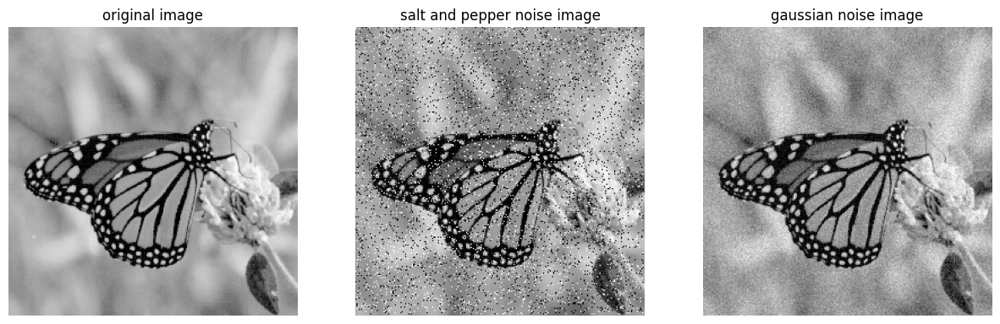

In [21]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from utils import add_salt_and_pepper_noise, add_gaussian_noise, bg_removal
from CannyWithAdaptiveOTSU import CannyWithAdaptiveOTSU

img = cv2.imread('./img/butterfly.bmp')
original_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

impulse_noise_img = add_salt_and_pepper_noise(img, 0.05)
impulse_noise_gray = cv2.cvtColor(impulse_noise_img, cv2.COLOR_BGR2GRAY)

gaussian_noise_img = add_gaussian_noise(img, 0, 20)
gaussian_noise_gray = cv2.cvtColor(gaussian_noise_img, cv2.COLOR_BGR2GRAY)

plt.figure(figsize=(15,5))
plt.subplot(131), plt.imshow(original_gray, 'gray'), plt.title("original image"), plt.axis("off")
plt.subplot(132), plt.imshow(impulse_noise_gray, 'gray'), plt.title("salt and pepper noise image"), plt.axis("off")
plt.subplot(133), plt.imshow(gaussian_noise_gray, 'gray'), plt.title("gaussian noise image"), plt.axis("off")
plt.show()

## 1.2 기존 노이즈 제거 필터

### 1.2.1 평균값 필터링

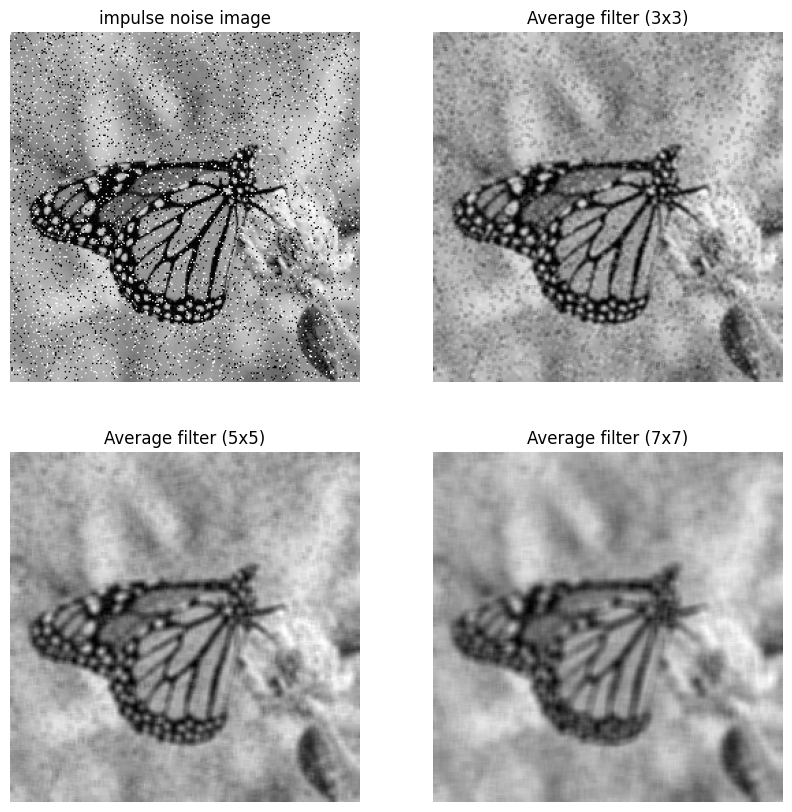

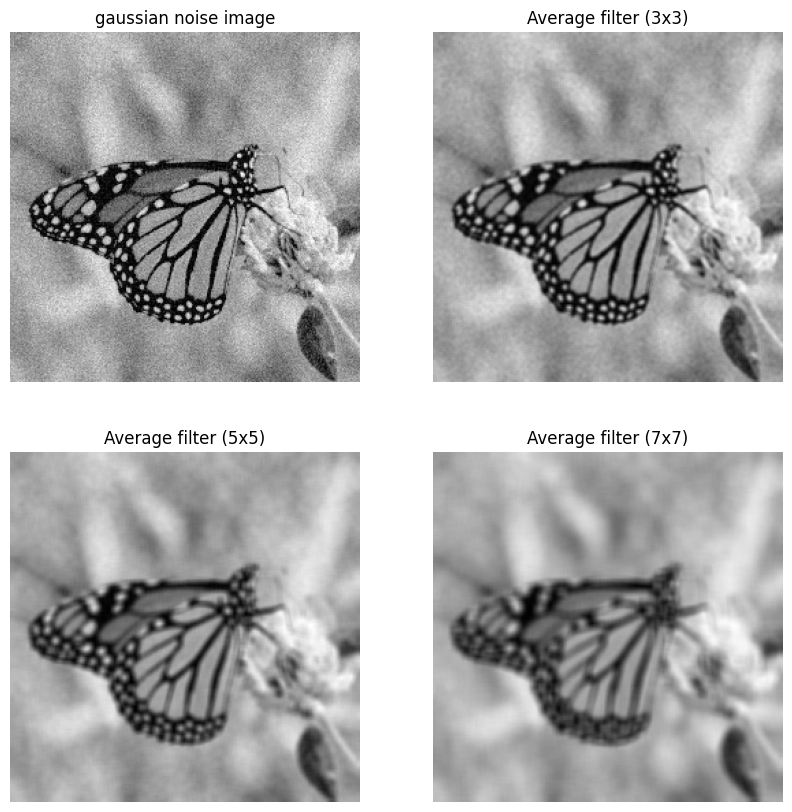

In [22]:
plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.blur(impulse_noise_gray, (3,3)), 'gray'),plt.title("Average filter (3x3)"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.blur(impulse_noise_gray, (5,5)), 'gray'),plt.title("Average filter (5x5)"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.blur(impulse_noise_gray, (7,7)), 'gray'),plt.title("Average filter (7x7)"), plt.axis("off")
plt.show()

plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.blur(gaussian_noise_gray, (3,3)), 'gray'),plt.title("Average filter (3x3)"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.blur(gaussian_noise_gray, (5,5)), 'gray'),plt.title("Average filter (5x5)"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.blur(gaussian_noise_gray, (7,7)), 'gray'),plt.title("Average filter (7x7)"), plt.axis("off")
plt.show()

### 1.2.2 가우시안 필터링

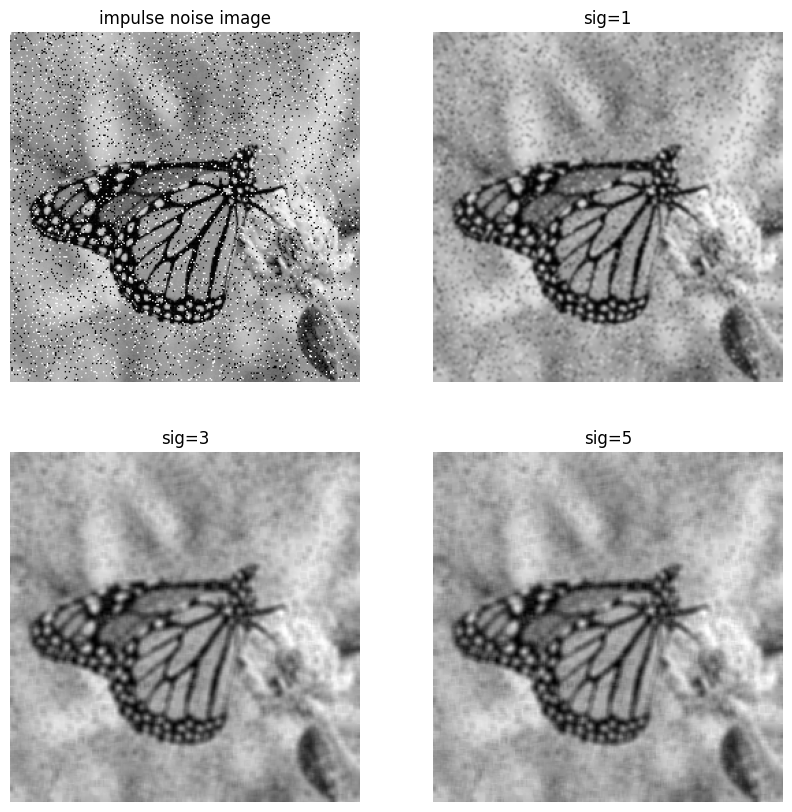

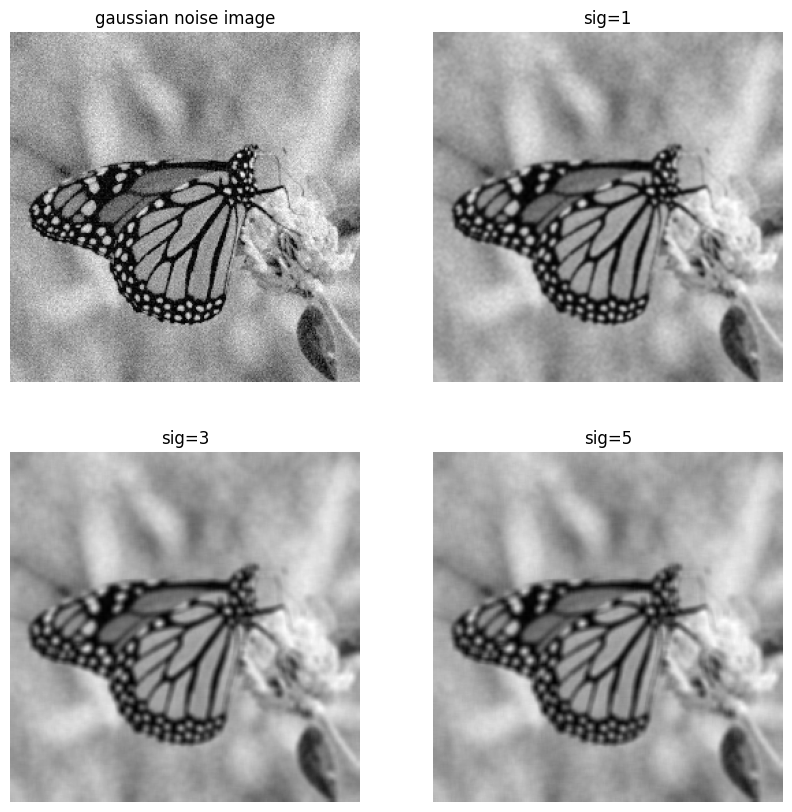

In [23]:
plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.GaussianBlur(impulse_noise_gray, (5,5), 1), 'gray'),plt.title("sig=1"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.GaussianBlur(impulse_noise_gray, (5,5), 3), 'gray'),plt.title("sig=3"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.GaussianBlur(impulse_noise_gray, (5,5), 5), 'gray'),plt.title("sig=5"), plt.axis("off")
plt.show()

plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.GaussianBlur(gaussian_noise_gray, (5,5), 1), 'gray'),plt.title("sig=1"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.GaussianBlur(gaussian_noise_gray, (5,5), 3), 'gray'),plt.title("sig=3"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.GaussianBlur(gaussian_noise_gray, (5,5), 5), 'gray'),plt.title("sig=5"), plt.axis("off")
plt.show()

### 1.2.3 중간값 필터링

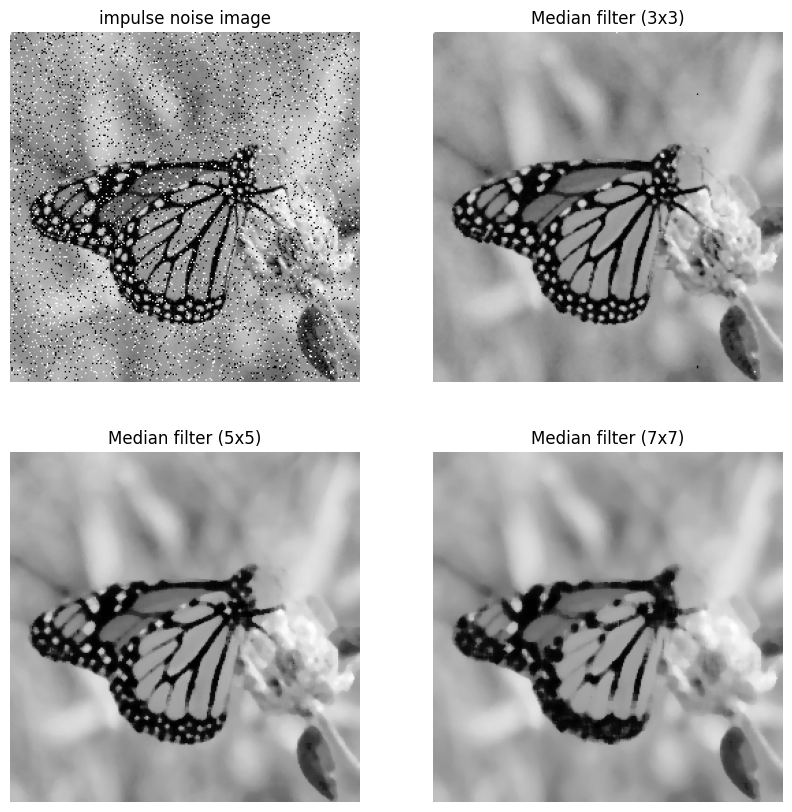

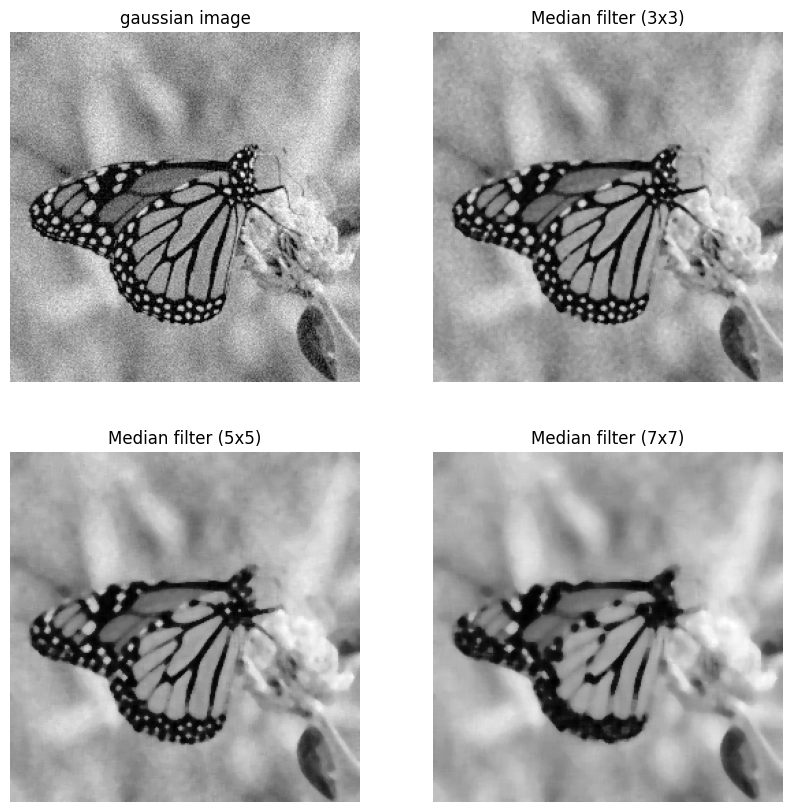

In [24]:
plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.medianBlur(impulse_noise_gray, 3), 'gray'),plt.title("Median filter (3x3)"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.medianBlur(impulse_noise_gray, 5), 'gray'),plt.title("Median filter (5x5)"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.medianBlur(impulse_noise_gray, 7), 'gray'),plt.title("Median filter (7x7)"), plt.axis("off")
plt.show()

plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.medianBlur(gaussian_noise_gray, 3), 'gray'),plt.title("Median filter (3x3)"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.medianBlur(gaussian_noise_gray, 5), 'gray'),plt.title("Median filter (5x5)"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.medianBlur(gaussian_noise_gray, 7), 'gray'),plt.title("Median filter (7x7)"), plt.axis("off")
plt.show()

### 1.2.4 양방향 필터링

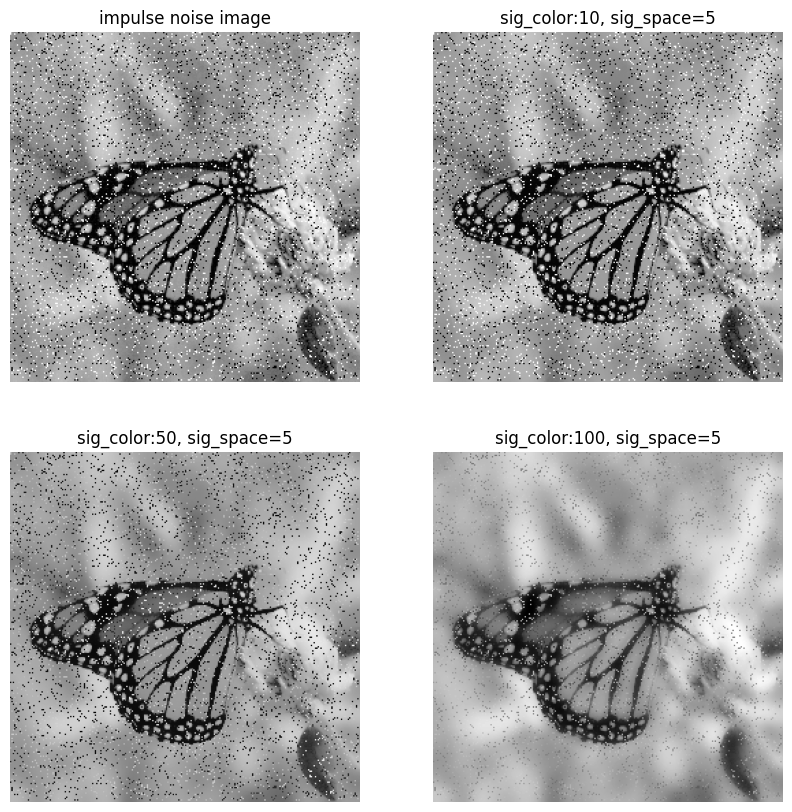

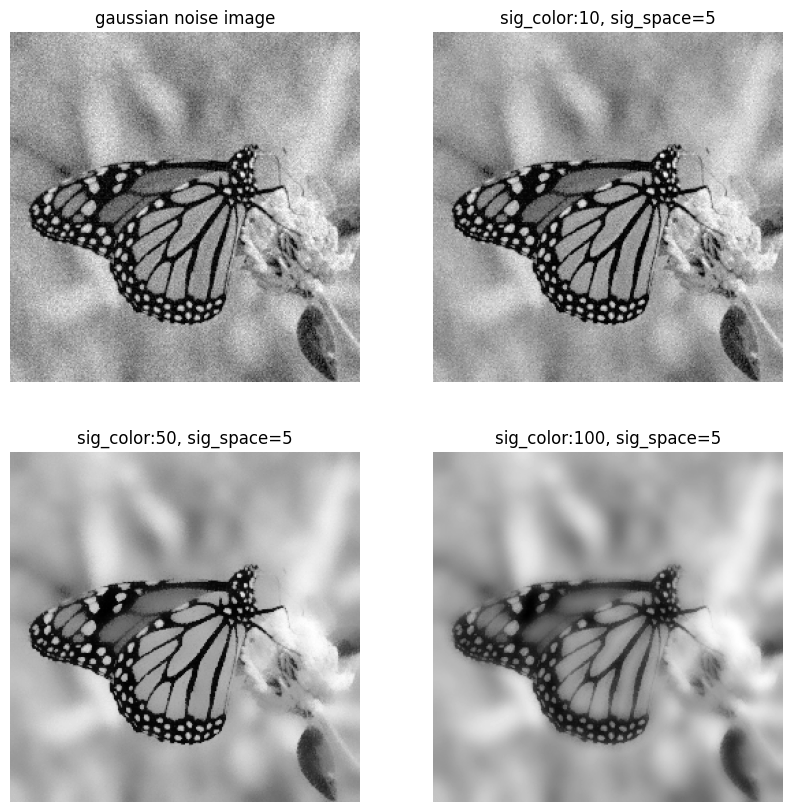

In [25]:

plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.bilateralFilter(impulse_noise_gray, -1, 10, 5), 'gray'),plt.title("sig_color:10, sig_space=5"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.bilateralFilter(impulse_noise_gray, -1, 50, 5), 'gray'),plt.title("sig_color:50, sig_space=5"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.bilateralFilter(impulse_noise_gray, -1, 100, 5), 'gray'),plt.title("sig_color:100, sig_space=5"), plt.axis("off")
plt.show()


plt.figure(figsize=(10,10))
plt.subplot(221),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian noise image"), plt.axis("off")
plt.subplot(222),plt.imshow(cv2.bilateralFilter(gaussian_noise_gray, -1, 10, 5), 'gray'),plt.title("sig_color:10, sig_space=5"), plt.axis("off")
plt.subplot(223),plt.imshow(cv2.bilateralFilter(gaussian_noise_gray, -1, 50, 5), 'gray'),plt.title("sig_color:50, sig_space=5"), plt.axis("off")
plt.subplot(224),plt.imshow(cv2.bilateralFilter(gaussian_noise_gray, -1, 100, 5), 'gray'),plt.title("sig_color:100, sig_space=5"), plt.axis("off")
plt.show()

## 향상된 잡음 제거 필터

### 중간값 기반 양방향 필터

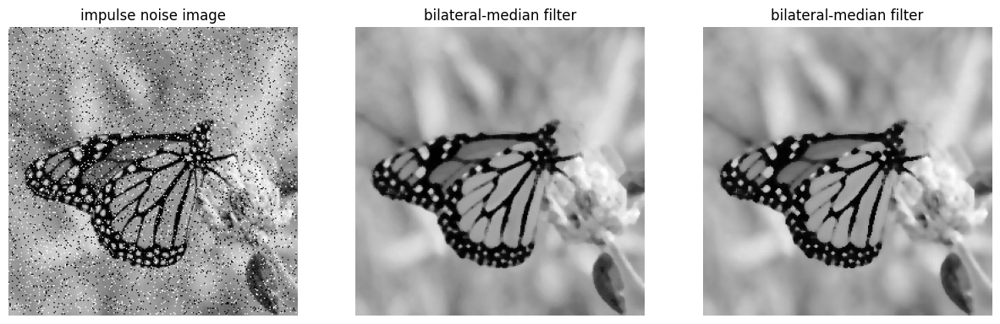

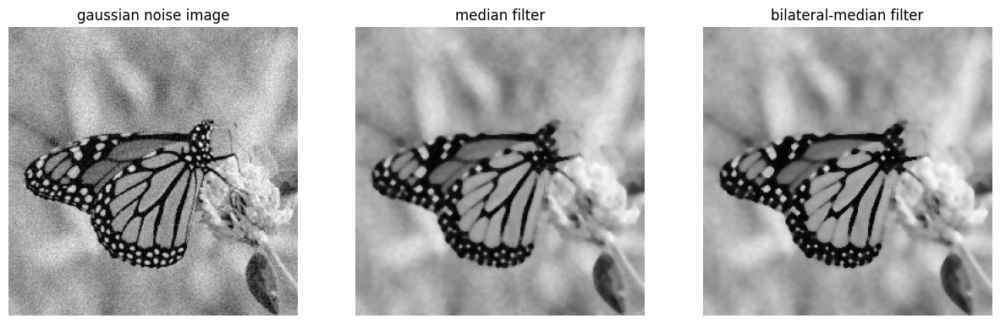

In [26]:
from utils import median_based_bilateral_filter

# 중앙값 필터
medianF_img = cv2.medianBlur(impulse_noise_gray, 5)

# 양방향-중간값 필터
bilateralMedianF_img = median_based_bilateral_filter(impulse_noise_gray, 5, 40, 10, 15)

plt.figure(figsize=(15,5))
plt.subplot(131),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(132),plt.imshow(medianF_img, 'gray'),plt.title("bilateral-median filter"), plt.axis("off")
plt.subplot(133),plt.imshow(bilateralMedianF_img, 'gray'),plt.title("bilateral-median filter"), plt.axis("off")
plt.show()

# 중앙값 필터
medianF_img = cv2.medianBlur(gaussian_noise_gray, 5)

# 양방향-중앙값 필터
bilateralMedianF_img = median_based_bilateral_filter(gaussian_noise_gray, 5, 40, 10, 15)

plt.figure(figsize=(15,5))
plt.subplot(131),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian noise image"), plt.axis("off")
plt.subplot(132),plt.imshow(medianF_img, 'gray'),plt.title("median filter"), plt.axis("off")
plt.subplot(133),plt.imshow(bilateralMedianF_img, 'gray'),plt.title("bilateral-median filter"), plt.axis("off")
plt.show()

### 스위칭 중간값 필터

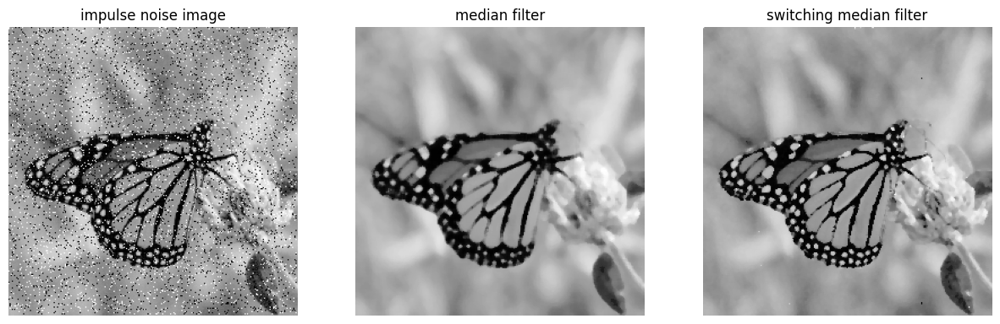

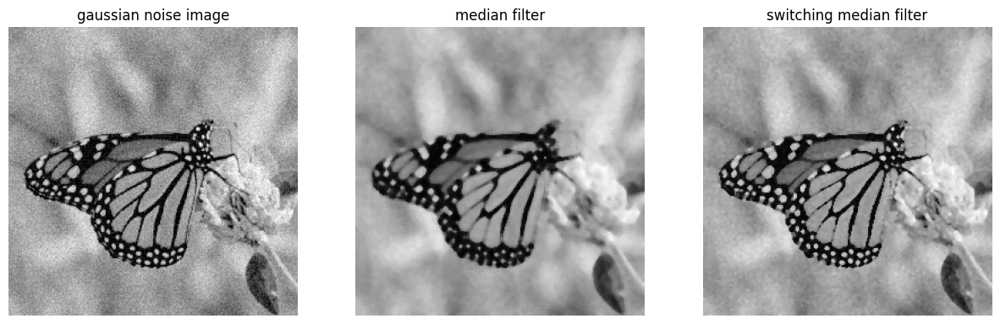

In [27]:
from utils import switching_median_filter

# 중앙값 필터
medianF_img = cv2.medianBlur(impulse_noise_gray, 5)

# 스위칭 중간값 필터
switchingMedianF_img = switching_median_filter(impulse_noise_gray, 3, 100, 30)

plt.figure(figsize=(15,5))
plt.subplot(131),plt.imshow(impulse_noise_gray, 'gray'),plt.title("impulse noise image"), plt.axis("off")
plt.subplot(132),plt.imshow(medianF_img, 'gray'),plt.title("median filter"), plt.axis("off")
plt.subplot(133),plt.imshow(switchingMedianF_img, 'gray'),plt.title("switching median filter"), plt.axis("off")
plt.show()

# 중앙값 필터
medianF_img = cv2.medianBlur(gaussian_noise_gray, 5)

# 양방향-중앙값 필터
switchingMedianF_img = switching_median_filter(gaussian_noise_gray, 3, 100, 30)

plt.figure(figsize=(15,5))
plt.subplot(131),plt.imshow(gaussian_noise_gray, 'gray'),plt.title("gaussian noise image"), plt.axis("off")
plt.subplot(132),plt.imshow(medianF_img, 'gray'),plt.title("median filter"), plt.axis("off")
plt.subplot(133),plt.imshow(switchingMedianF_img, 'gray'),plt.title("switching median filter"), plt.axis("off")
plt.show()

## 기존 윤곽선 추출 알고리즘

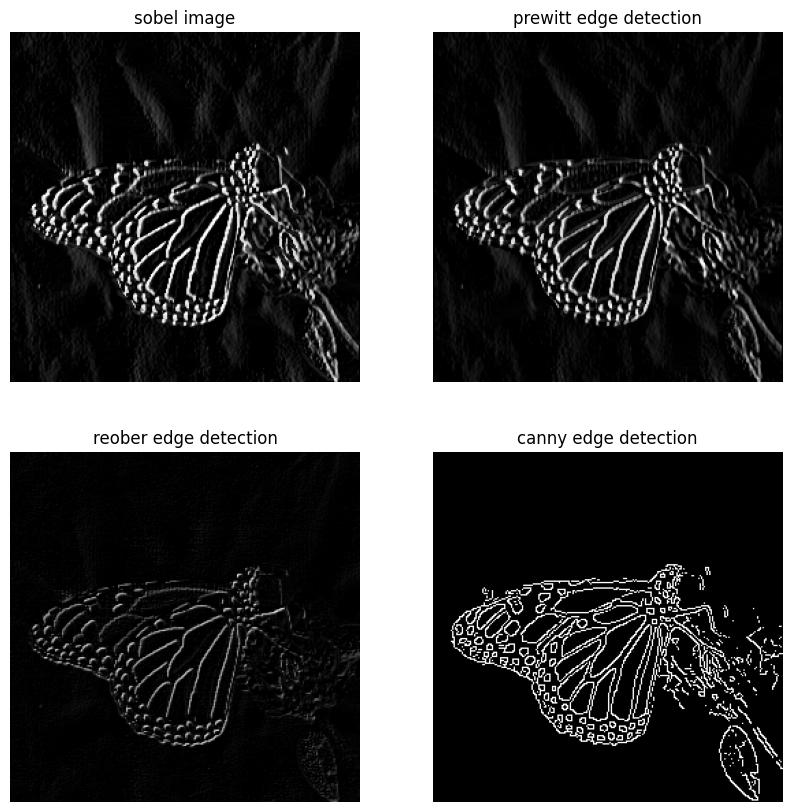

In [28]:
# 소벨
x = cv2.Sobel(original_gray, -1, 1, 0, delta=0)
y = cv2.Sobel(original_gray, -1, 0, 1, delta=0)

absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)

sobel_edge = cv2.addWeighted(absX, 0.7, absY, 0.1, 0)

# 프리윗
gx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]],dtype=int)
gy = np.array([[1,1,1],[0,0,0],[-1,-1,-1]],dtype=int)

x = cv2.filter2D(original_gray, -1, gx, delta=0)
y = cv2.filter2D(original_gray, -1, gy, delta=0)

# uint8 타입(0~255)로 변경하고 영상 합하기
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)
prewiit_edge = cv2.addWeighted(absX, 0.7, absY, 0.1, 0)

# 로버트 크로스 필터
gx = np.array([[-1, 0], [0, 1]], dtype=int)
gy = np.array([[0, -1], [1, 0]], dtype=int)

# 로버트 크로스 컨벌루션
x = cv2.filter2D(original_gray, -1, gx, delta=0)
y = cv2.filter2D(original_gray, -1, gy, delta=0)

# 절대값 취하기
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)
robert_edge = cv2.addWeighted(absX, 0.7, absY, 0.1, 0)

# 캐니
canny_edge = cv2.Canny(original_gray, 200, 200)

plt.figure(figsize=(10,10))
plt.subplot(221), plt.imshow(sobel_edge, 'gray'), plt.title("sobel image"), plt.axis("off")
plt.subplot(222), plt.imshow(prewiit_edge, 'gray'), plt.title("prewitt edge detection"), plt.axis("off")
plt.subplot(223), plt.imshow(robert_edge, 'gray'), plt.title("reober edge detection"), plt.axis("off")
plt.subplot(224), plt.imshow(canny_edge, 'gray'), plt.title("canny edge detection"), plt.axis("off")
plt.show()

## OTSU 알고리즘

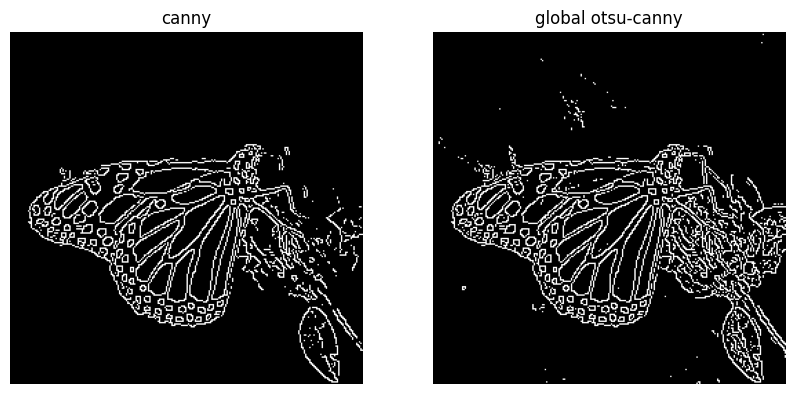

In [29]:
# 2. Global OTSU-Canny
otsu_th, otsu_binary = cv2.threshold(original_gray, -1, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)

# 임계값 수동 설정의 번거로움 극복, 불필요한 윤곽선
global_otsu_canny = cv2.Canny(original_gray, otsu_th, otsu_th)

plt.figure(figsize=(10,5))
# plt.subplot(131), plt.imshow(original_gray, 'gray'), plt.title("original image"), plt.axis("off")
plt.subplot(121), plt.imshow(canny_edge, 'gray'), plt.title("canny"), plt.axis("off")
plt.subplot(122), plt.imshow(global_otsu_canny, 'gray'), plt.title("global otsu-canny"), plt.axis("off")
plt.show()

## 적응형 OTSU-캐니 알고리즘

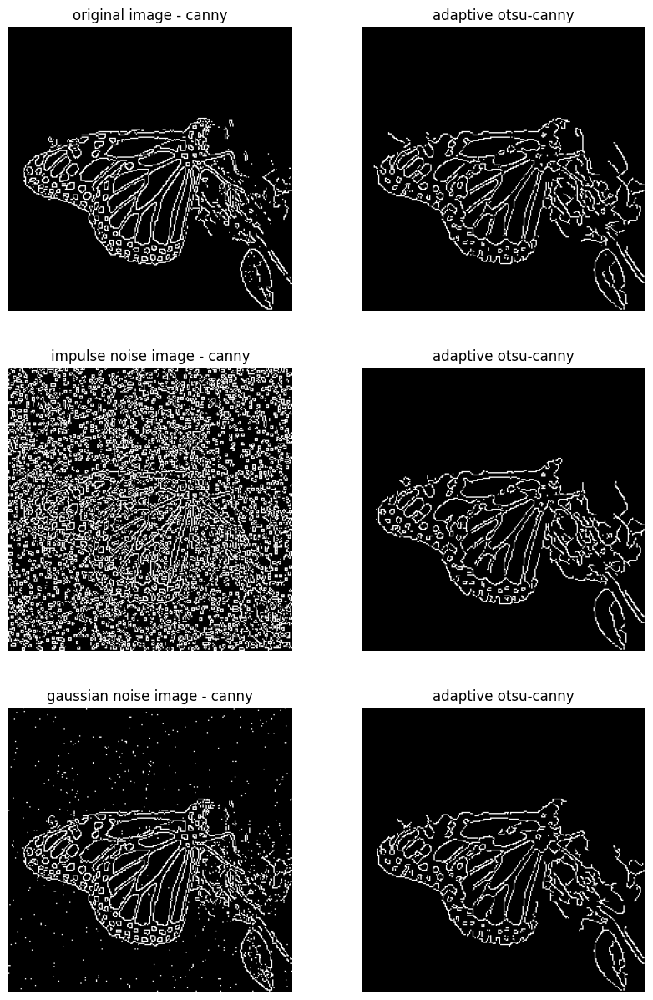

In [30]:
# Adaptive OTSU-Canny
# 윤곽선 손실 완화, 보다 매끄러운 윤곽선, 비교적 많은 계산량
adpative_otsu_canny = CannyWithAdaptiveOTSU(original_gray, block_size=32).get_result(blur='med_bilateral')
adpative_otsu_canny2 = CannyWithAdaptiveOTSU(impulse_noise_gray, block_size=32).get_result(blur='med_bilateral')
adpative_otsu_canny3 = CannyWithAdaptiveOTSU(gaussian_noise_gray, block_size=32).get_result(blur='med_bilateral')

plt.figure(figsize=(10,15))
plt.subplot(321), plt.imshow(cv2.Canny(original_gray, 200, 200), 'gray'), plt.title("original image - canny"), plt.axis("off")
plt.subplot(322), plt.imshow(adpative_otsu_canny, 'gray'), plt.title("adaptive otsu-canny"), plt.axis("off")
plt.subplot(323), plt.imshow(cv2.Canny(impulse_noise_gray, 200, 200), 'gray'), plt.title("impulse noise image - canny"), plt.axis("off")
plt.subplot(324), plt.imshow(adpative_otsu_canny2, 'gray'), plt.title("adaptive otsu-canny"), plt.axis("off")
plt.subplot(325), plt.imshow(cv2.Canny(gaussian_noise_gray, 200, 200), 'gray'), plt.title("gaussian noise image - canny"), plt.axis("off")
plt.subplot(326), plt.imshow(adpative_otsu_canny3, 'gray'), plt.title("adaptive otsu-canny"), plt.axis("off")
plt.show()

## 배경 제거

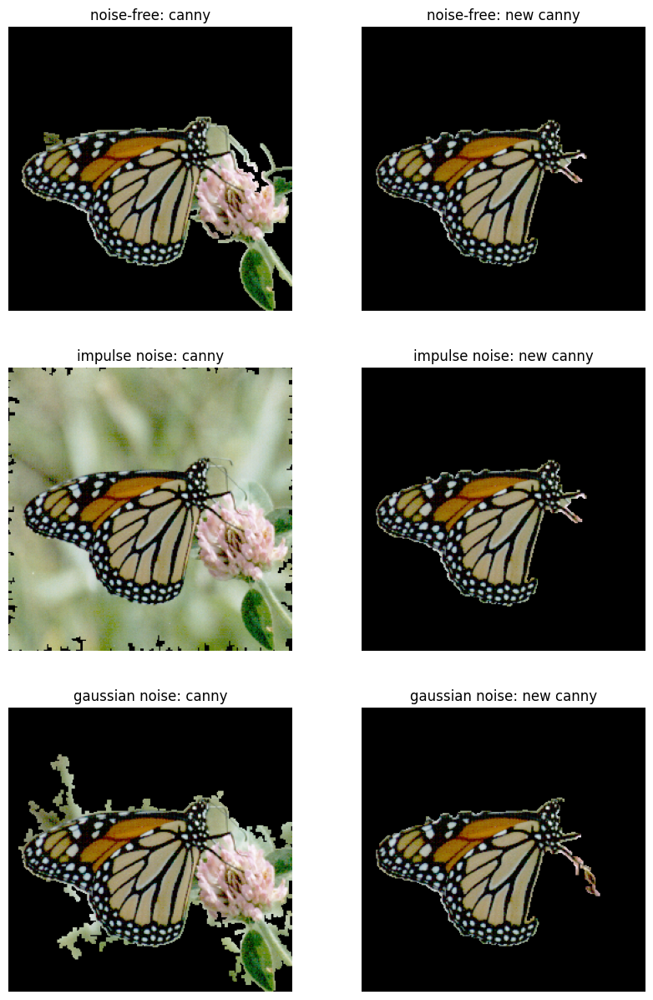

In [32]:
import cv2
import matplotlib.pyplot as plt
from CannyWithAdaptiveOTSU import CannyWithAdaptiveOTSU
from utils import bg_removal, add_gaussian_noise, add_salt_and_pepper_noise

# get foreground img
img = cv2.imread('./img/butterfly.bmp')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# get background img
bg = cv2.imread('./img/bg.bmp')
bg = cv2.cvtColor(bg, cv2.COLOR_BGR2RGB)

# add noise
impulse_img = add_salt_and_pepper_noise(img, 0.05)
impulse_gray = cv2.cvtColor(impulse_img, cv2.COLOR_BGR2GRAY)
gaussian_img = add_gaussian_noise(img, 0, 20)
gaussian_gray = cv2.cvtColor(gaussian_img, cv2.COLOR_BGR2GRAY)

# noise free
canny_edge = cv2.Canny(gray, 100, 200)
br_canny = bg_removal(img, bg, canny_edge)
new_canny_edge = CannyWithAdaptiveOTSU(impulse_gray, block_size=32).get_result(blur='med_bilateral')
# new_canny_edge = CannyWithAdaptiveOTSU(impulse_gray, block_size=32).get_result(blur='median')
br_new_canny = bg_removal(img, bg, new_canny_edge)

# impulse noise
impulse_canny_edge = cv2.Canny(impulse_gray, 100, 200)
impulse_br_canny = bg_removal(img, bg, impulse_canny_edge)
impulse_new_canny_edge = CannyWithAdaptiveOTSU(impulse_gray, block_size=32).get_result(blur='med_bilateral')
# impulse_new_canny_edge = CannyWithAdaptiveOTSU(impulse_gray, block_size=32).get_result(blur='median')
impulse_br_new_canny = bg_removal(img, bg, impulse_new_canny_edge)

# gaussian noise
gaussian_canny_edge = cv2.Canny(gaussian_gray, 100, 200)
gaussian_br_canny = bg_removal(img, bg, gaussian_canny_edge)
gaussian_new_canny_edge = CannyWithAdaptiveOTSU(gaussian_gray, block_size=32).get_result(blur='med_bilateral')
# gaussian_new_canny_edge = CannyWithAdaptiveOTSU(gaussian_gray, block_size=32).get_result(blur='median')
gaussian_br_new_canny = bg_removal(img, bg, gaussian_new_canny_edge)

plt.figure(figsize=(10,15))
plt.subplot(321),plt.imshow(br_canny, 'gray'),plt.title("noise-free: canny"), plt.axis("off")
plt.subplot(322),plt.imshow(br_new_canny, 'gray'),plt.title("noise-free: new canny"), plt.axis("off")
plt.subplot(323),plt.imshow(impulse_br_canny, 'gray'),plt.title("impulse noise: canny"), plt.axis("off")
plt.subplot(324),plt.imshow(impulse_br_new_canny, 'gray'),plt.title("impulse noise: new canny"), plt.axis("off")
plt.subplot(325),plt.imshow(gaussian_br_canny, 'gray'),plt.title("gaussian noise: canny"), plt.axis("off")
plt.subplot(326),plt.imshow(gaussian_br_new_canny, 'gray'),plt.title("gaussian noise: new canny"), plt.axis("off")

plt.show()